Licensed under the MIT License.

Copyright (c) 2021-2031. All rights reserved.

# Dimensional Reduction

In [1]:
import pandas as pd
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from category_encoders import TargetEncoder
import plotly.express as px 
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA 
from sklearn.manifold import Isomap, MDS, TSNE, LocallyLinearEmbedding as LLE
from umap import UMAP

import warnings
warnings.filterwarnings('ignore')

## Load Data

* Run this notebook to generate the data first: https://github.com/lady-h-world/My_Garden/blob/main/code/crystal_ball/data_collector/generate_campaign.ipynb

In [2]:
df = pd.read_pickle('structured_data/campaign_deposit.pkl')
print(df.shape)

df.head()

(11162, 17)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,1
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,1
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,1
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,1
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,1


## Data Preprocessing

In [3]:
# encode categorical features
target_col = 'deposit'
y = df[target_col]
X = df.drop(target_col, axis=1)
print(X.shape, y.shape)

cat_cols = [col for col in X.columns if X[col].dtype=='object']
enc = TargetEncoder(cols=cat_cols).fit(X, y)
enc_X = enc.transform(X)

enc_X.head()

(11162, 16) (11162,)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,59,0.473013,0.43379,0.447407,0.476351,2343,0.366408,0.495259,0.225916,5,0.32755,1042,1,-1,0,0.406678
1,56,0.473013,0.43379,0.447407,0.476351,45,0.570311,0.495259,0.225916,5,0.32755,1467,1,-1,0,0.406678
2,41,0.460779,0.43379,0.447407,0.476351,1270,0.366408,0.495259,0.225916,5,0.32755,1389,1,-1,0,0.406678
3,55,0.399783,0.43379,0.447407,0.476351,2476,0.366408,0.495259,0.225916,5,0.32755,579,1,-1,0,0.406678
4,54,0.473013,0.43379,0.541068,0.476351,184,0.570311,0.495259,0.225916,5,0.32755,673,2,-1,0,0.406678


In [4]:
X_train, X_test, y_train, y_test = train_test_split(enc_X, y, test_size=0.25, random_state=10, stratify=y)

# standardize features
scaler=StandardScaler()
std_X_train = scaler.fit_transform(X_train)
std_X_test = scaler.transform (X_test)

print(std_X_train.shape, y_train.shape, std_X_test.shape, y_test.shape)
std_X_train

(8371, 16) (8371,) (2791, 16) (2791,)


array([[ 1.40310708,  0.36230171,  0.1505176 , ..., -0.4842679 ,
        -0.36531854, -0.44850859],
       [ 0.64918132, -0.00799831, -0.80696093, ..., -0.4842679 ,
        -0.36531854, -0.44850859],
       [ 0.90048991, -0.14124188, -0.80696093, ..., -0.4842679 ,
        -0.36531854, -0.44850859],
       ...,
       [-0.43982255, -1.19308636,  1.41546589, ..., -0.4842679 ,
        -0.36531854, -0.44850859],
       [-0.52359208,  1.00280362, -0.80696093, ..., -0.4842679 ,
        -0.36531854, -0.44850859],
       [ 1.31933755,  2.06370201, -0.80696093, ..., -0.4842679 ,
        -0.36531854, -0.44850859]])

## Dimensional Reduction

#### References
* How does PCA work: https://towardsdatascience.com/pca-principal-component-analysis-how-to-get-superior-results-with-fewer-dimensions-7a70e8ab798c
* How does LDA work: https://towardsdatascience.com/lda-linear-discriminant-analysis-how-to-improve-your-models-with-supervised-dimensionality-52464e73930f
* How does Isomap work: https://towardsdatascience.com/isomap-embedding-an-awesome-approach-to-non-linear-dimensionality-reduction-fc7efbca47a0
* How does MDS work: https://towardsdatascience.com/mds-multidimensional-scaling-smart-way-to-reduce-dimensionality-in-python-7c126984e60b
* How does t-SNE work: https://towardsdatascience.com/t-sne-machine-learning-algorithm-a-great-tool-for-dimensionality-reduction-in-python-ec01552f1a1e
  * sklearn t-SNE params: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
* How does LLEwork: https://towardsdatascience.com/lle-locally-linear-embedding-a-nifty-way-to-reduce-dimensionality-in-python-ab5c38336107
* How does UMAP work: https://towardsdatascience.com/umap-dimensionality-reduction-an-incredibly-robust-machine-learning-algorithm-b5acb01de568
  * UMAP params: https://umap-learn.readthedocs.io/en/latest/api.html
  * Basic UMAP params: https://umap-learn.readthedocs.io/en/latest/parameters.html
 
#### Note 🌺
* In all the plots below, yellow is class 0 and purple is class 1.

#### PCA plot

* When using PCA, no matter which value you set for `n_components`, if it's within the value range and other params stay unchanged, then you will get the same explained variance for each PC.
  * For example, when n_components=3, you will just get the top 3PCs same as what you got when n_components=16.

*************** PCA Summary ***************
No. of features:  16
No. of samples:  8371
No. of components:  16
Explained variance ratio:  [0.15548584 0.1045785  0.09476607 0.07149026 0.06760422 0.06254871
 0.05914298 0.05713503 0.054275   0.05318695 0.05052554 0.04176846
 0.04081406 0.03229779 0.02860019 0.0257804 ]


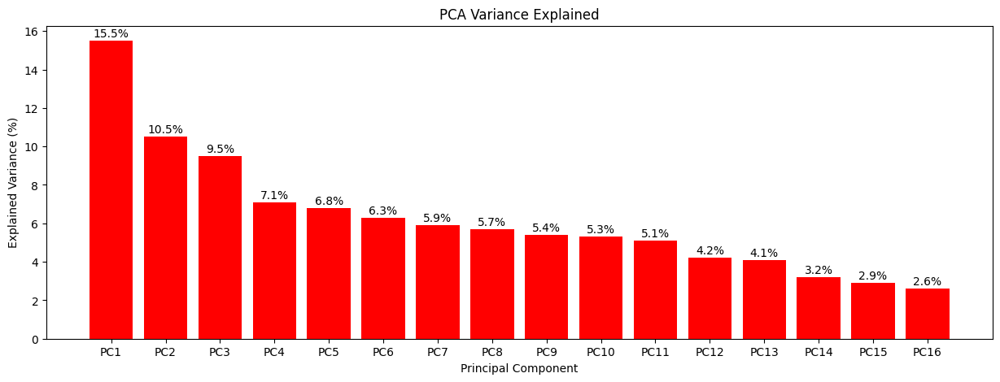

In [10]:
pca = PCA(n_components=16)

# Fit the model
embeded_X_train = pca.fit_transform(std_X_train)

# Print the results
print('*************** PCA Summary ***************')
print('No. of features: ', pca.n_features_)
print('No. of samples: ', pca.n_samples_)
print('No. of components: ', pca.n_components_)
print('Explained variance ratio: ', pca.explained_variance_ratio_)

x_ax=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 
     'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16']
y_ax=pca.explained_variance_ratio_.round(3)*100

# Create a plot
plt.figure(figsize=(15,5))
plt.bar(x=x_ax, height=y_ax, color='red')

# Annotate chart by adding values on top of the bars
for i in range(len(x_ax)):
    plt.text(i,y_ax[i]+0.2,str(y_ax[i].round(3))+'%', ha = 'center')

# Set title for chart and axis        
plt.title(label='PCA Variance Explained', loc='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')

plt.show()

*************** PCA Summary ***************
No. of features:  16
No. of samples:  8371
No. of components:  3
Explained variance ratio:  [0.15548555 0.1045781  0.09476454]


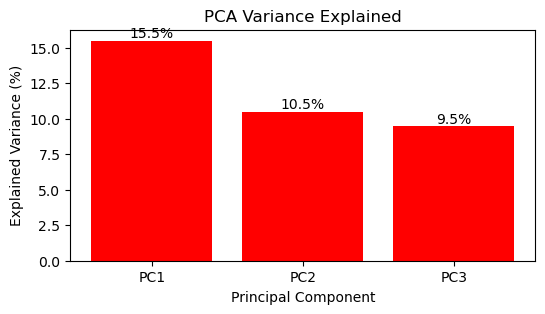

In [10]:
pca = PCA(n_components=3)

# Fit the model
embeded_X_train = pca.fit_transform(std_X_train)

# Print the results
print('*************** PCA Summary ***************')
print('No. of features: ', pca.n_features_)
print('No. of samples: ', pca.n_samples_)
print('No. of components: ', pca.n_components_)
print('Explained variance ratio: ', pca.explained_variance_ratio_)

x_ax=['PC1', 'PC2', 'PC3']
y_ax=pca.explained_variance_ratio_.round(3)*100

# Create a plot
plt.figure(figsize=(6,3))
plt.bar(x=x_ax, height=y_ax, color='red')

# Annotate chart by adding values on top of the bars
for i in range(len(x_ax)):
    plt.text(i,y_ax[i]+0.2,str(y_ax[i].round(3))+'%', ha = 'center')

# Set title for chart and axis        
plt.title(label='PCA Variance Explained', loc='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')

plt.show()

In [11]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['PC1', 'PC2', 'PC3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,PC1,PC2,PC3,deposit
0,-0.154797,-0.919971,-0.083116,1
1,-0.538399,-0.489522,1.177209,0
2,-0.457814,-1.409617,0.994438,0
3,-1.131734,0.410901,-0.290567,1
4,0.247064,-1.505284,1.291602,1


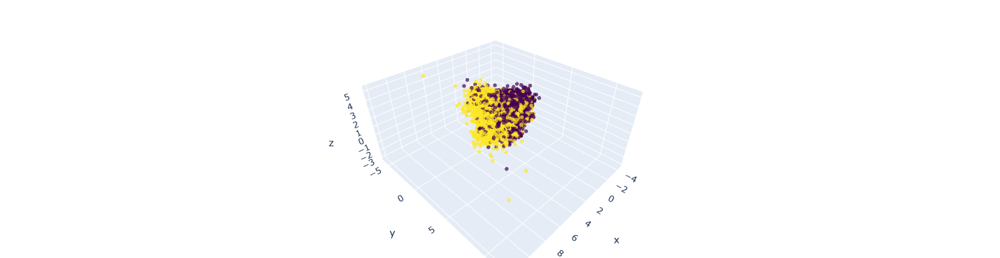

In [19]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['PC1'], 
    y=embeded_df['PC2'], 
    z=embeded_df['PC3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

#### LDA plot

The limitation of LDA is, its `n_components` cannot be larger than `min(n_features, n_classes - 1))`. In this case, as we only have 2 classes, then there is only 1 component.

In [20]:
lda = LDA(
    solver='eigen',
    n_components=None  # n_components cannot be larger than min(n_features, n_classes - 1); None is default value and will choose between min(n_features, n_classes - 1)
)

# Fit transform the data
embeded_X_train = lda.fit_transform(std_X_train, y_train)

# Print the results
print('*************** LDA Summary ***************')
print('Classes: ', lda.classes_)
print('Priors: ', lda.priors_)
print('Explained variance ratio: ', lda.explained_variance_ratio_)

*************** LDA Summary ***************
Classes:  [0 1]
Priors:  [0.52610202 0.47389798]
Explained variance ratio:  [1.]


In [21]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['LDA1'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,LDA1,deposit
0,2.727916,1
1,-1.245354,0
2,-1.029051,0
3,0.707146,1
4,-0.224635,1


<Axes: ylabel='Frequency'>

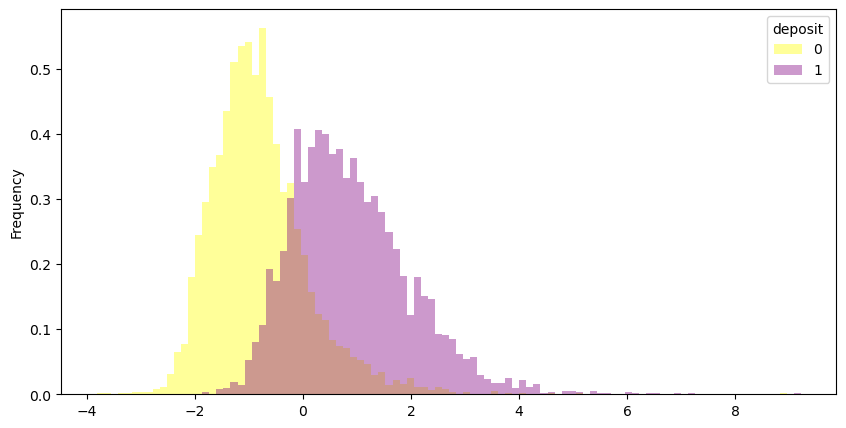

In [22]:
embeded_df.pivot(columns='deposit', values='LDA1')\
            .plot.hist(alpha=0.4, legend=True, bins=100, density=True, color=['yellow', 'purple'], figsize=(10,5))

#### Isomap plot

In [12]:
iso = Isomap(
    n_neighbors=5, # default=5, algorithm finds local structures based on the nearest neighbors
    n_components=3, # number of dimensions
    eigen_solver='auto', 
    path_method='auto',
    neighbors_algorithm='auto',
    n_jobs=-1,
    metric='minkowski', # string, or callable, default=”minkowski”
    p=2, 
    metric_params=None
)

### Step 2 - Fit the data and transform it, so we have 3 dimensions instead of 64
embeded_X_train = iso.fit_transform(std_X_train)
embeded_X_train

array([[  0.30802936,   3.84476594,   5.1371591 ],
       [  3.45763035, -15.26656746,   0.95422979],
       [  1.91157676,   2.0159728 ,  -3.59809914],
       ...,
       [-13.92664804,   3.06980017,  -3.17470835],
       [ -7.95086689,  -2.80259195,  -5.97896635],
       [ -0.93332816, -14.26810678,   6.2302526 ]])

In [13]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['col1', 'col2', 'col3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,col1,col2,col3,deposit
0,0.308029,3.844766,5.137159,1
1,3.457630,-15.266567,0.954230,0
2,1.911577,2.015973,-3.598099,0
3,-1.656607,5.529184,7.233558,1
4,3.230218,3.667668,-4.373334,1


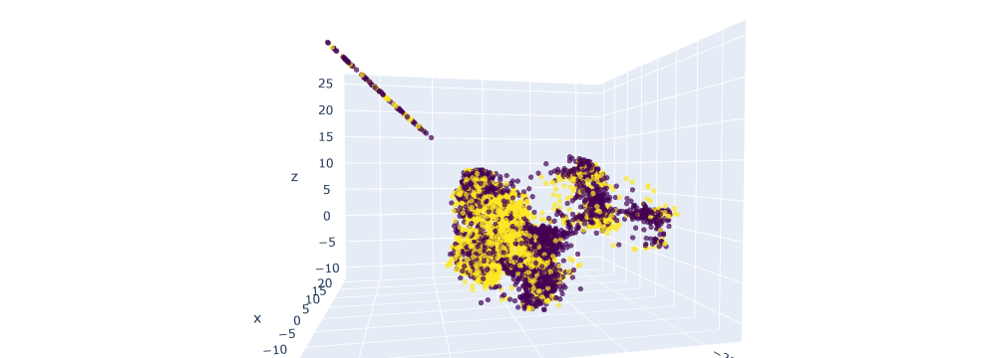

In [14]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['col1'], 
    y=embeded_df['col2'], 
    z=embeded_df['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

#### MDS plot

In [25]:
mds = MDS(n_components=3, 
          metric=True, 
          n_init=4, 
          max_iter=300, 
          verbose=0, 
          eps=0.001, 
          n_jobs=-1, 
          random_state=10, 
          dissimilarity='euclidean')

### Step 2 - Fit the data and transform it, so we have 2 dimensions instead of 3
embeded_X_train = mds.fit_transform(std_X_train)
    
### Step 3 - Print a few stats
print('The new shape of X: ', embeded_X_train.shape)
print('No. of Iterations: ', mds.n_iter_)
print('Stress: ', mds.stress_)

The new shape of X:  (8371, 3)
No. of Iterations:  300
Stress:  50187753.048123114


In [26]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['col1', 'col2', 'col3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,col1,col2,col3,deposit
0,-1.333438,-0.383583,-3.832352,1
1,1.369276,-1.209979,2.721594,0
2,1.467152,1.279679,1.455509,0
3,0.484009,-1.576265,-1.584287,1
4,0.050193,0.420907,2.719354,1


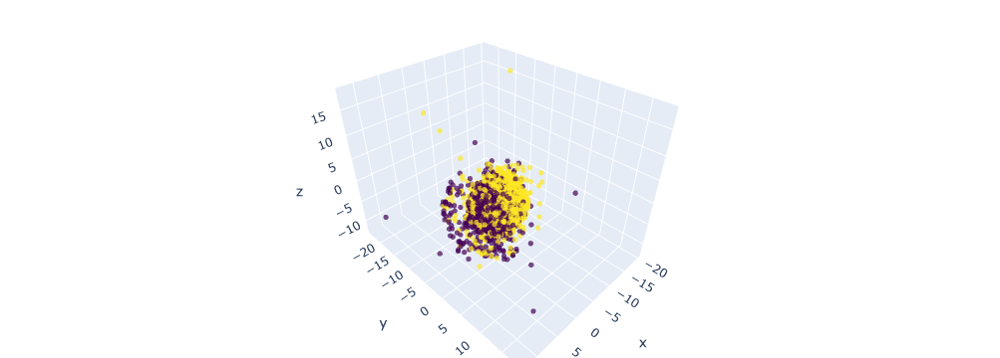

In [27]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['col1'], 
    y=embeded_df['col2'], 
    z=embeded_df['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

#### t-SNE plot

In [11]:
embed = TSNE(
    n_components=3, # Dimension of the embedded space.
    perplexity=20, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12,
    learning_rate=200,
    n_iter=5000,
    n_iter_without_progress=300,
    min_grad_norm=0.000001, 
    metric='euclidean',
    init='random', 
    verbose=0, 
    random_state=10,
    method='barnes_hut',
    angle=0.5,
    n_jobs=-1, 
)

embeded_X_train = embed.fit_transform(std_X_train)

# Print results
print('New Shape of X: ', embeded_X_train.shape)
print('Kullback-Leibler divergence after optimization: ', embed.kl_divergence_)
print('No. of iterations: ', embed.n_iter_)

New Shape of X:  (8371, 3)
Kullback-Leibler divergence after optimization:  1.0410749912261963
No. of iterations:  4999


In [12]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['col1', 'col2', 'col3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,col1,col2,col3,deposit
0,8.744842,22.085220,11.983462,1
1,5.504545,-3.901415,-29.227919,0
2,-4.637197,-21.785631,2.638229,0
3,16.530777,10.640998,-6.838735,1
4,-5.427508,-18.903725,-15.853227,1


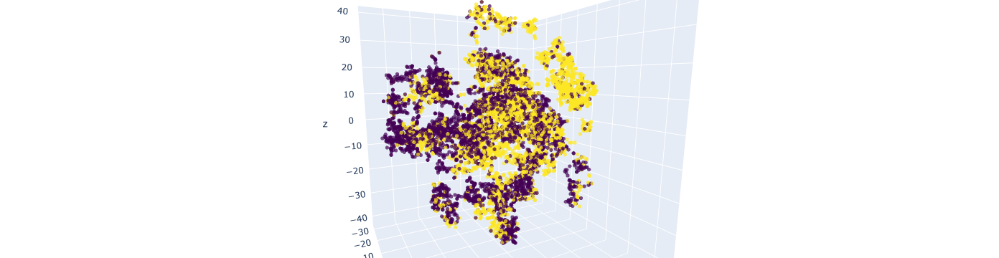

In [13]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['col1'], 
    y=embeded_df['col2'], 
    z=embeded_df['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

#### LLE plot

In [14]:
embed = LLE(n_neighbors=5,
              n_components=3,
              reg=0.001,
              eigen_solver='dense',
              method='modified',
              neighbors_algorithm='auto',
              random_state=10,
              n_jobs=-1
             )

embeded_X_train = embed.fit_transform(std_X_train)

In [15]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['col1', 'col2', 'col3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,col1,col2,col3,deposit
0,-0.001032,0.008144,-0.006852,1
1,-0.001032,0.008144,-0.006852,0
2,-0.001032,0.008144,-0.006852,0
3,-0.001032,0.008144,-0.006852,1
4,-0.001032,0.008144,-0.006852,1


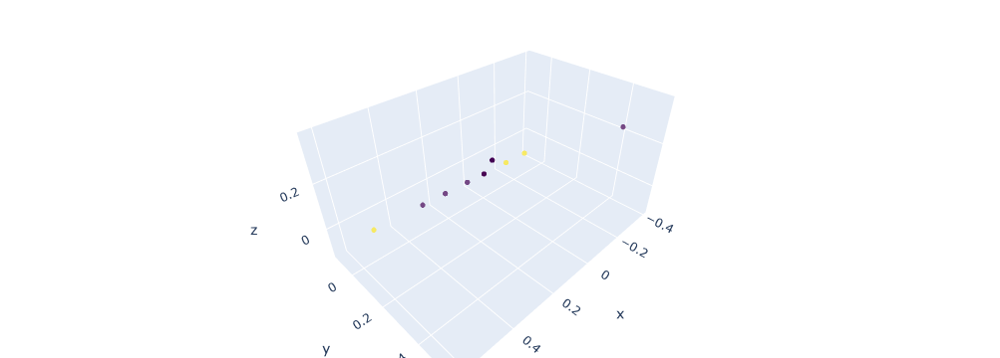

In [16]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['col1'], 
    y=embeded_df['col2'], 
    z=embeded_df['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

#### UMAP

In [17]:
# unsupervised UMAP
embed = UMAP(n_neighbors=200,
               n_components=3,
               metric='euclidean',
               n_epochs=1000,
               learning_rate=0.1,
               init='spectral',
               min_dist=0.1,
               spread=1.0,
               low_memory=True,
               set_op_mix_ratio=1.0,
               random_state=10,
               transform_seed=10,
               verbose=False,
               unique=False
              )

embeded_X_train = embed.fit_transform(std_X_train)

In [18]:
embeded_df = pd.DataFrame(embeded_X_train, columns=['col1', 'col2', 'col3'])
embeded_df[target_col] = y_train.values
embeded_df.head()

,col1,col2,col3,deposit
0,-1.176515,-0.634506,7.874350,1
1,1.416412,7.175391,1.667620,0
2,1.573488,3.581409,10.162680,0
3,-1.916296,-0.806993,8.532999,1
4,2.307703,2.111521,9.071366,1


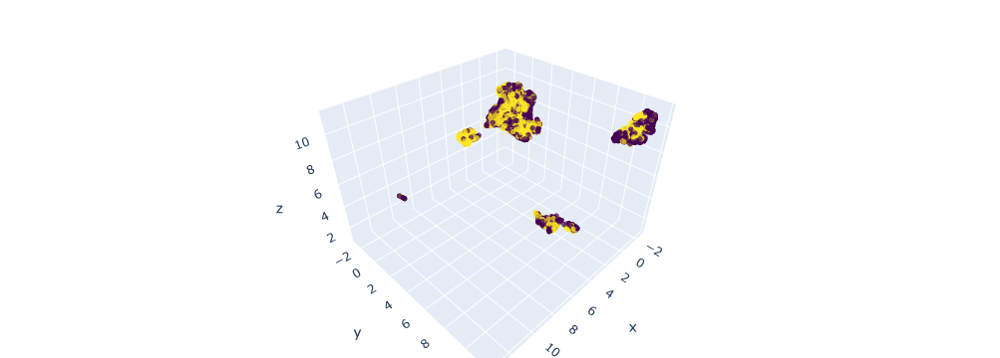

In [19]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df['col1'], 
    y=embeded_df['col2'], 
    z=embeded_df['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [20]:
# supervised UMAP
embed2 = UMAP(n_neighbors=200,
               n_components=3,
               metric='euclidean',
               n_epochs=1000,
               learning_rate=0.1,
               init='spectral',
               min_dist=0.1,
               spread=1.0,
               low_memory=True,
               set_op_mix_ratio=1.0,
               random_state=10,
               transform_seed=10,
               verbose=False,
               unique=False
              )

embeded_X_train2 = embed2.fit_transform(std_X_train, y_train)
embed_X_test = embed2.transform(std_X_test)

In [21]:
embeded_df_train = pd.DataFrame(embeded_X_train2, columns=['col1', 'col2', 'col3'])
embeded_df_train[target_col] = y_train.values
print(embeded_df_train.shape)
embeded_df_train.head()

(8371, 4)


,col1,col2,col3,deposit
0,9.499098,-6.158878,6.590126,1
1,0.624575,18.529629,4.004495,0
2,3.856600,10.816241,4.229795,0
3,9.550692,-5.628173,6.276263,1
4,10.758410,-7.089837,7.841075,1


In [22]:
embeded_df_test = pd.DataFrame(embed_X_test, columns=['col1', 'col2', 'col3'])
embeded_df_test[target_col] = y_test.values
print(embeded_df_test.shape)
embeded_df_test.head()

(2791, 4)


,col1,col2,col3,deposit
0,7.485783,7.900000,5.225324,0
1,8.356614,5.131181,5.386292,1
2,6.545915,-7.388399,8.424871,1
3,0.394737,10.580491,2.241459,0
4,5.235404,10.221331,3.214948,1


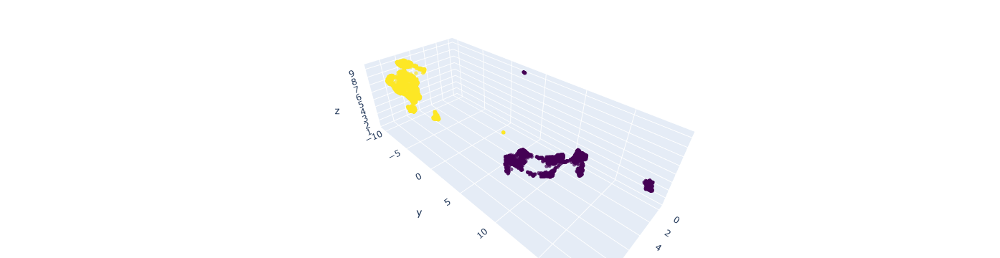

In [23]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df_train['col1'], 
    y=embeded_df_train['col2'], 
    z=embeded_df_train['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df_train['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

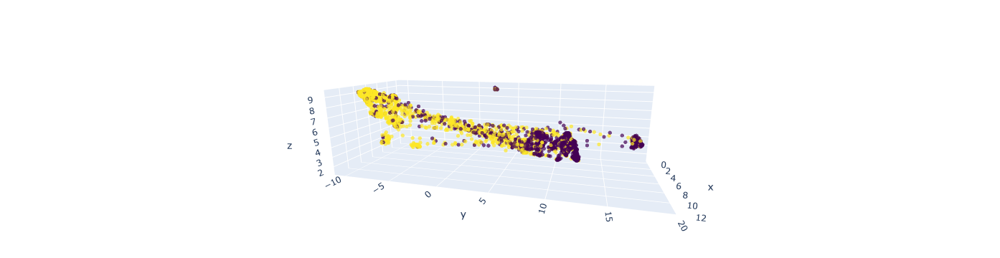

In [24]:
fig = go.Figure(data=[go.Scatter3d(
    x=embeded_df_test['col1'], 
    y=embeded_df_test['col2'], 
    z=embeded_df_test['col3'],
    mode='markers',
    marker=dict(
        size=3,
        color=embeded_df_test['deposit'],
        colorscale='Viridis',
        opacity=0.7
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()